# General Settings

In [6]:
specie = 'leptocybe-invasa' # 'thaumastocoris-peregrinus' # 
training = 'south-east-asia' 
interest = 'south-east-asia'

count = 10000
# 100m ~ 0.001 deg

# 1000m ~ 0.01 deg
ref_res = (0.01, 0.01) # deg

region_train = 'south-east-asia'  # 'all' #  'south-east-asia' # 
region_test = 'south-east-asia' # 'east-asia' # 'south-east-asia' # 

pseudoabsence = 'random' # 'biased-land-cover' # 'biased' # 'random' # 
bioclim = [i for i in range(1,20)] #[1,12] #[1, 5, 6, 12, 13, 14]# [1, 16, 6, 11] # [1,3,6,7,15,16] # 

year0 = 1981
year1 = 2005

savefig = True
topo1 = False
ndvi1 = False

n_iteration = 10
iteration = 5

In [2]:
# initiate the dask cluster
from dask.distributed import LocalCluster

cluster = LocalCluster(dashboard_address=35779)

client = cluster.get_client()

/opt/anaconda3/envs/aciar/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 35779 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 38085 instead
  warnings.warn(


# Preparation Data

In [3]:
%run '00_data-preparation.ipynb'

         lat         lon                 date source References  Elevation (m)
0 -37.741471  144.918649  2023-07-12T13:02:00   GBIF        NaN            NaN
1  43.192550     5.61277  2017-02-19T00:00:00   GBIF        NaN            NaN
2  43.671210     7.20069  2017-11-22T00:00:00   GBIF        NaN            NaN
3  43.192550     5.61277  2017-02-19T00:00:00   GBIF        NaN            NaN
4  40.593751    8.167206  2022-05-21T00:00:00   GBIF        NaN            NaN
Number of occurences globally is: 2081


# Specie Distribution

Number of occurences globally is: 2081


,Unnamed: 0,lat,lon,date,source,References,Elevation (m)
0,0,-37.741471,144.918649,2023-07-12T13:02:00,GBIF,NaN,NaN
1,1,43.192550,5.61277,2017-02-19T00:00:00,GBIF,NaN,NaN
2,2,43.671210,7.20069,2017-11-22T00:00:00,GBIF,NaN,NaN
3,3,43.192550,5.61277,2017-02-19T00:00:00,GBIF,NaN,NaN
4,4,40.593751,8.167206,2022-05-21T00:00:00,GBIF,NaN,NaN
...,...,...,...,...,...,...,...
2076,25,11.750000,106.92,NaN,SE Asia,NaN,NaN
2077,26,19.420000,103.5,NaN,SE Asia,NaN,NaN
2078,27,17.980000,102.63,NaN,SE Asia,NaN,NaN
2079,28,7.480000,80.65,NaN,SE Asia,NaN,NaN


Number of occurences globally after removing occurrences without coordinates: 1103


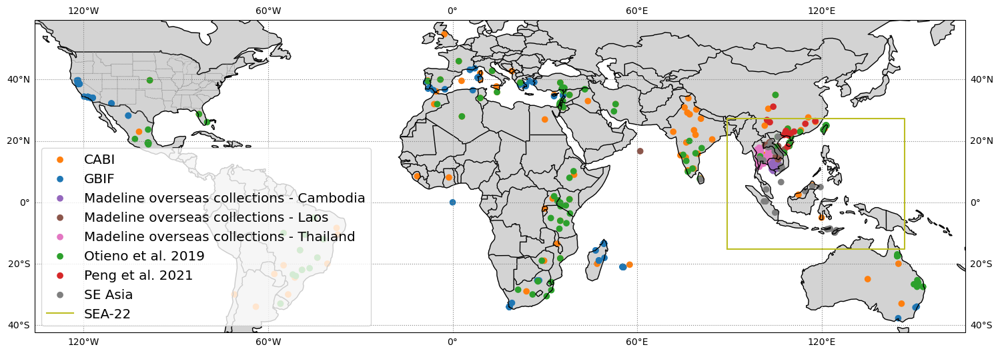

Number of occurences in south-east-asia is: 695
Split 1 -> Train: 486 rows, Test: 209 rows
Split 2 -> Train: 486 rows, Test: 209 rows
Split 3 -> Train: 486 rows, Test: 209 rows
Split 4 -> Train: 486 rows, Test: 209 rows
Split 5 -> Train: 486 rows, Test: 209 rows
Split 6 -> Train: 486 rows, Test: 209 rows
Split 7 -> Train: 486 rows, Test: 209 rows
Split 8 -> Train: 486 rows, Test: 209 rows
Split 9 -> Train: 486 rows, Test: 209 rows
Split 10 -> Train: 486 rows, Test: 209 rows


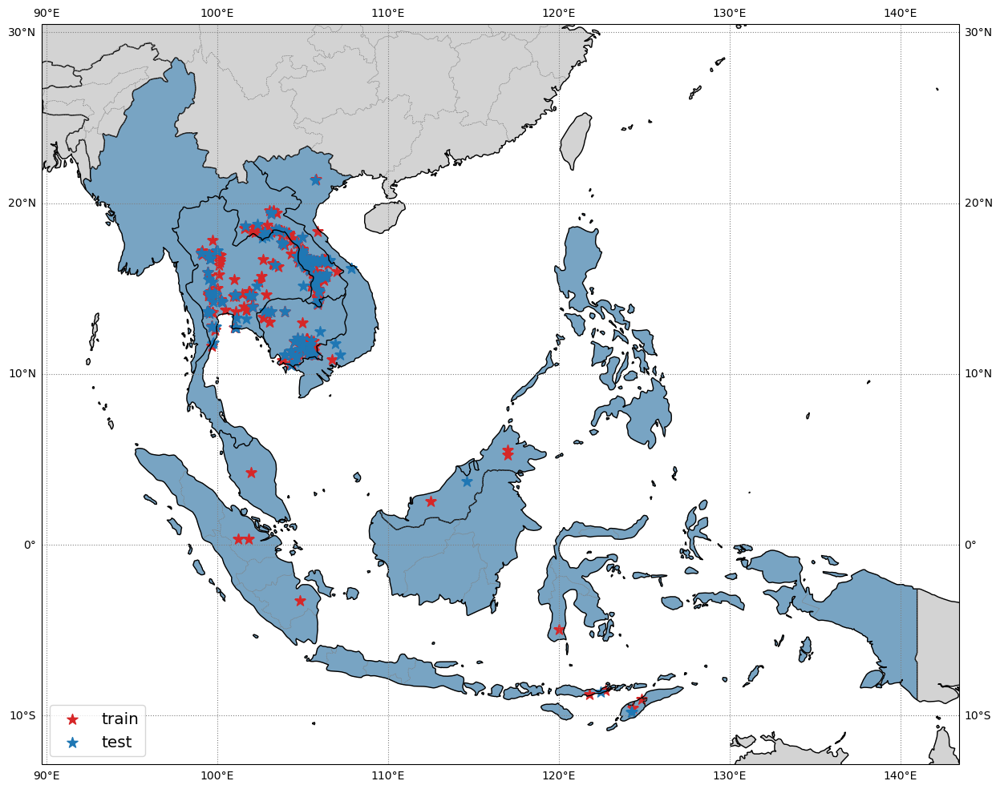

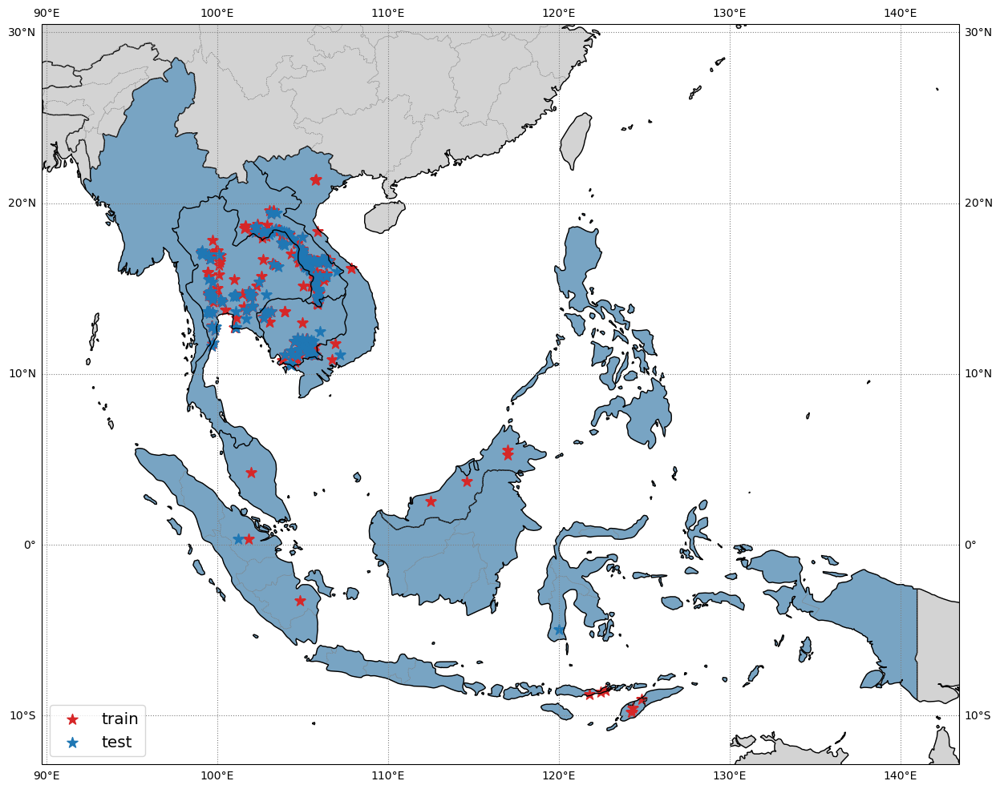

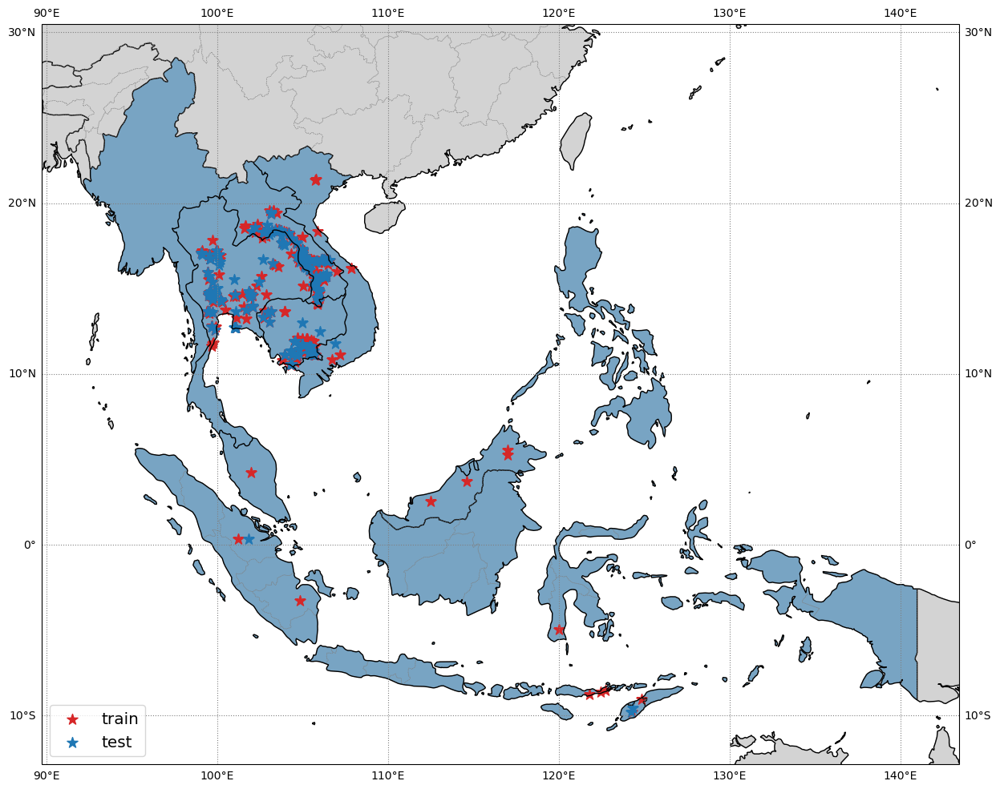

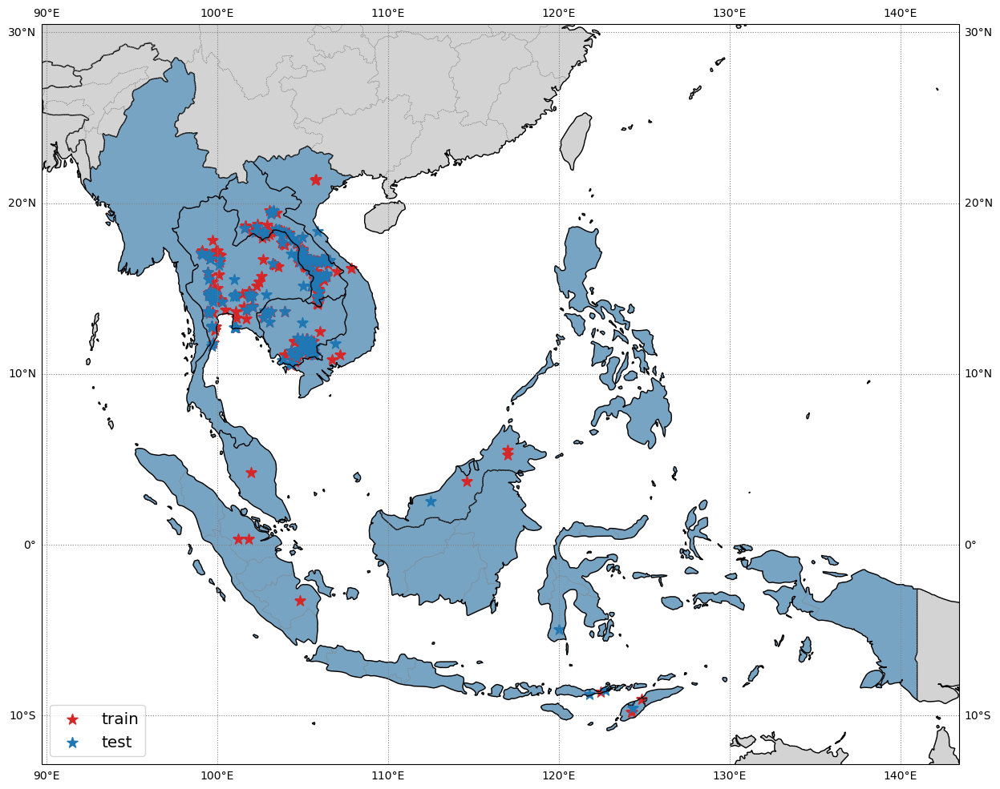

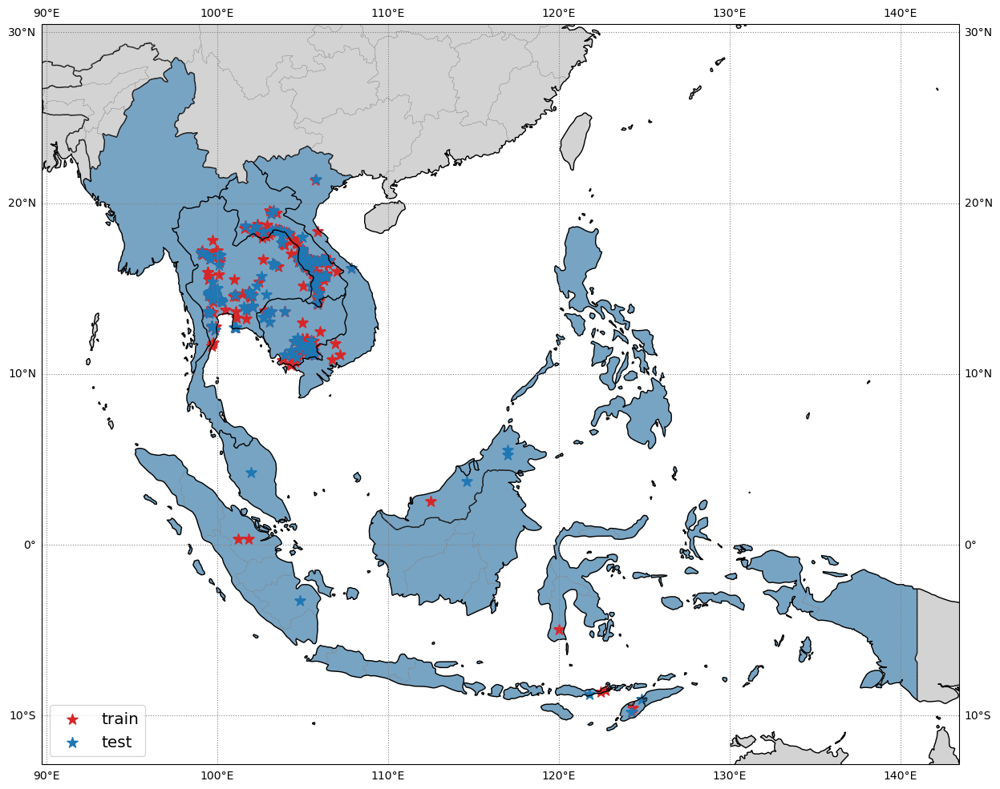

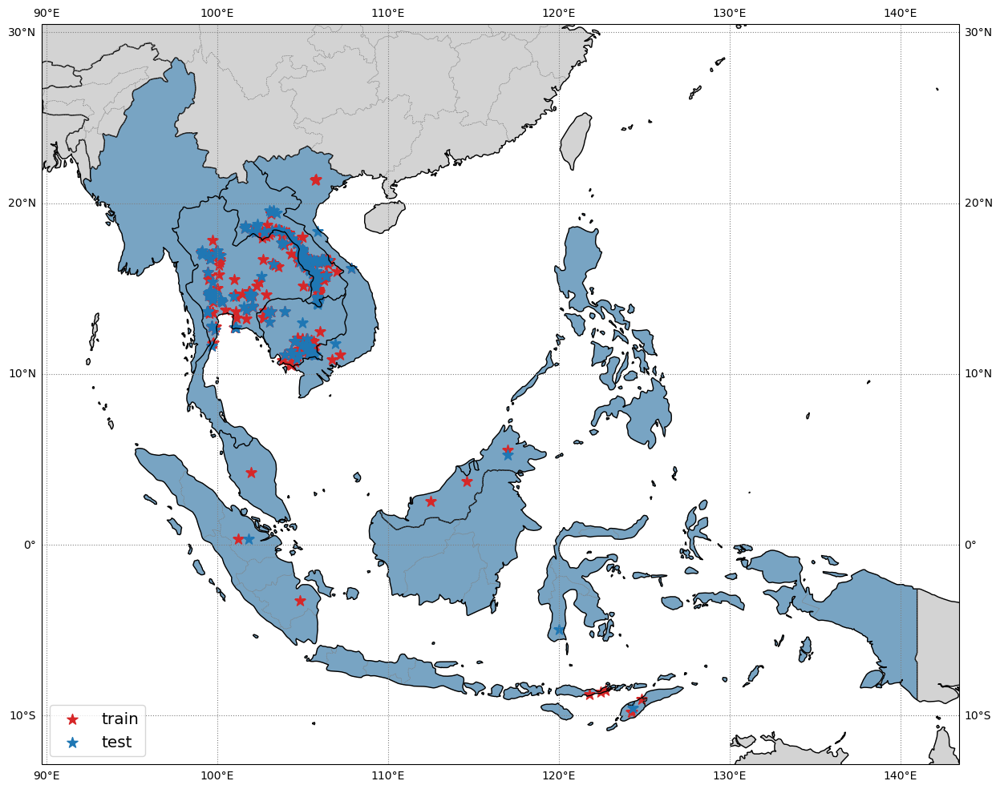

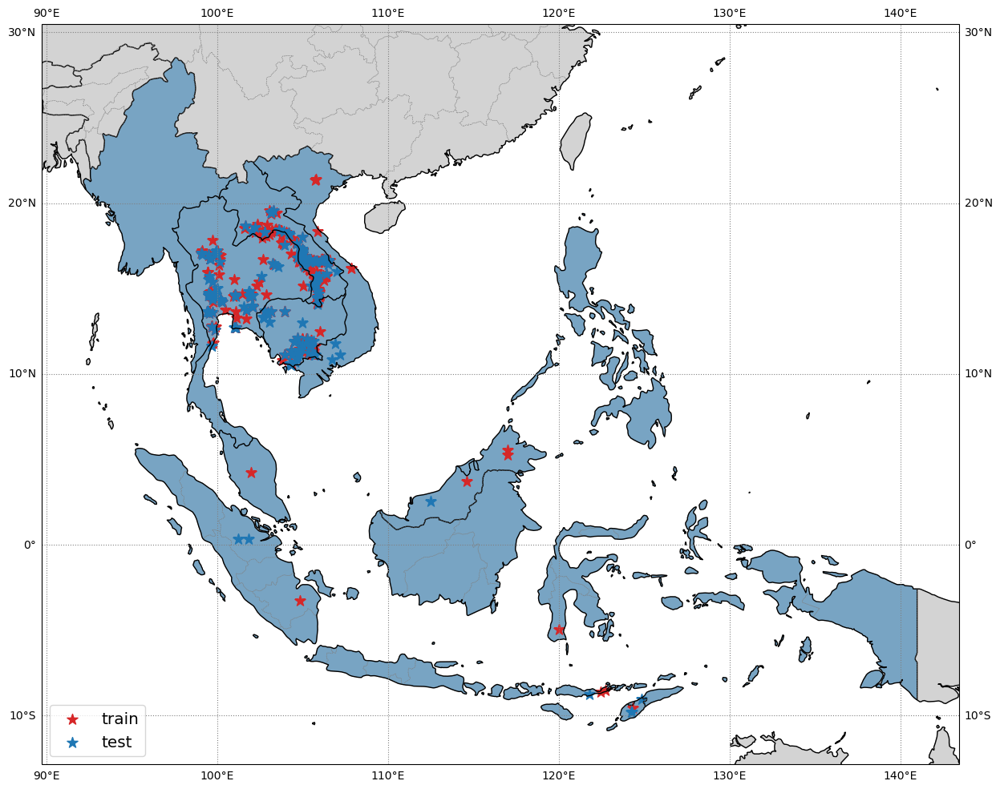

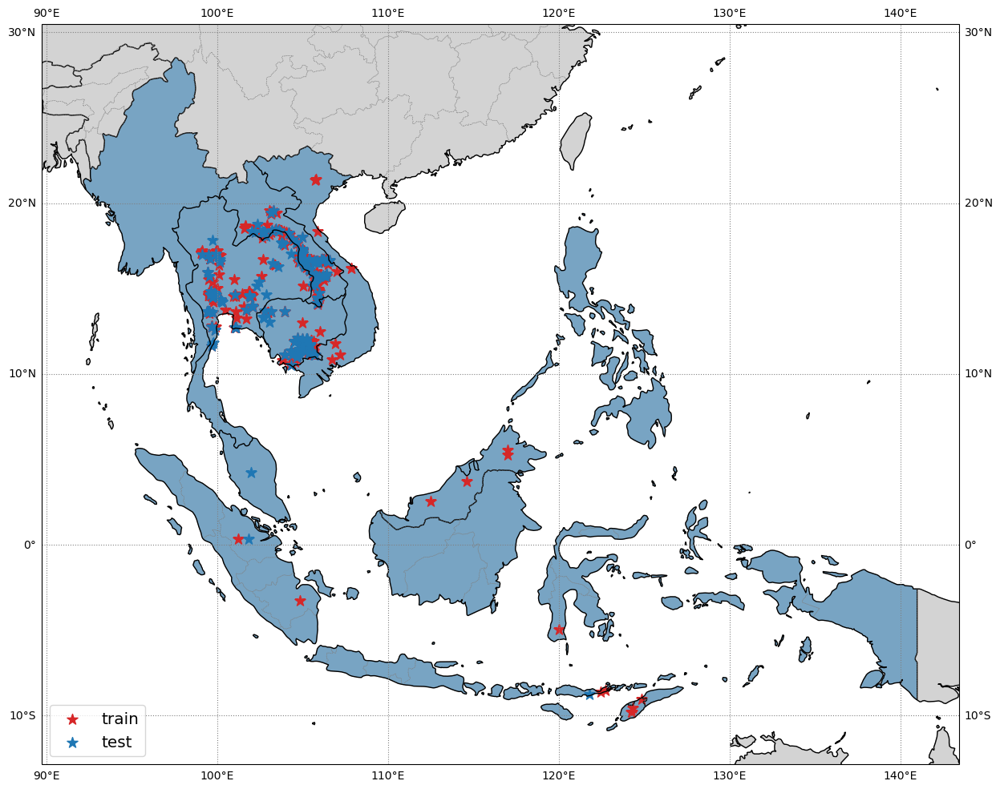

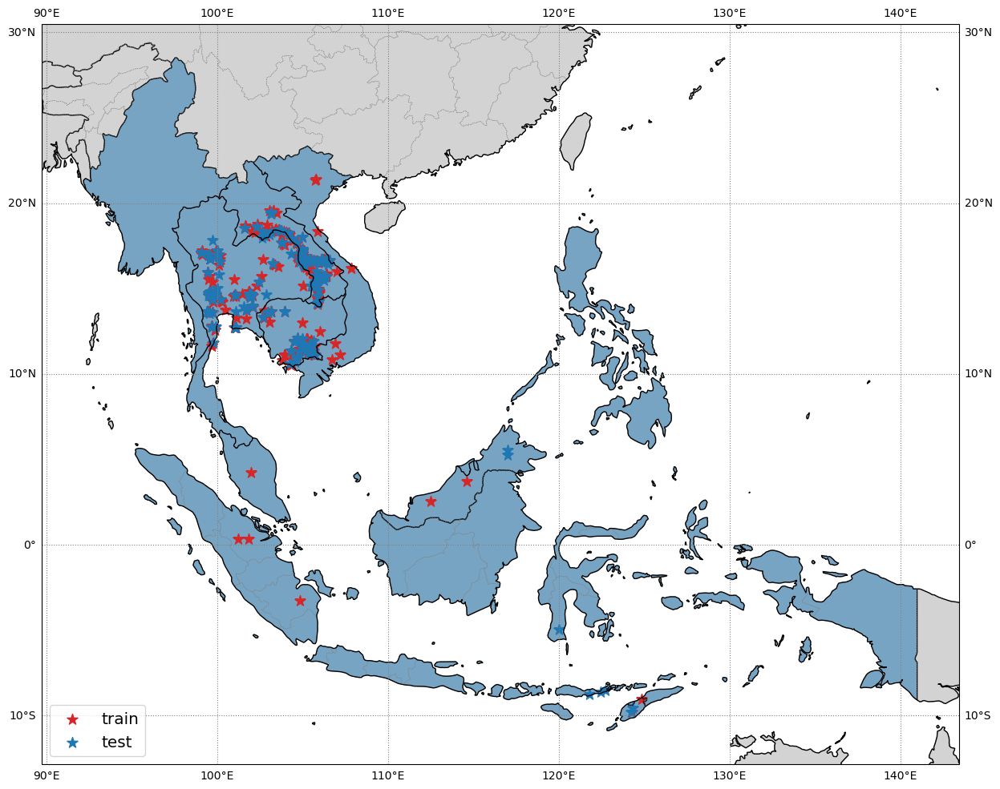

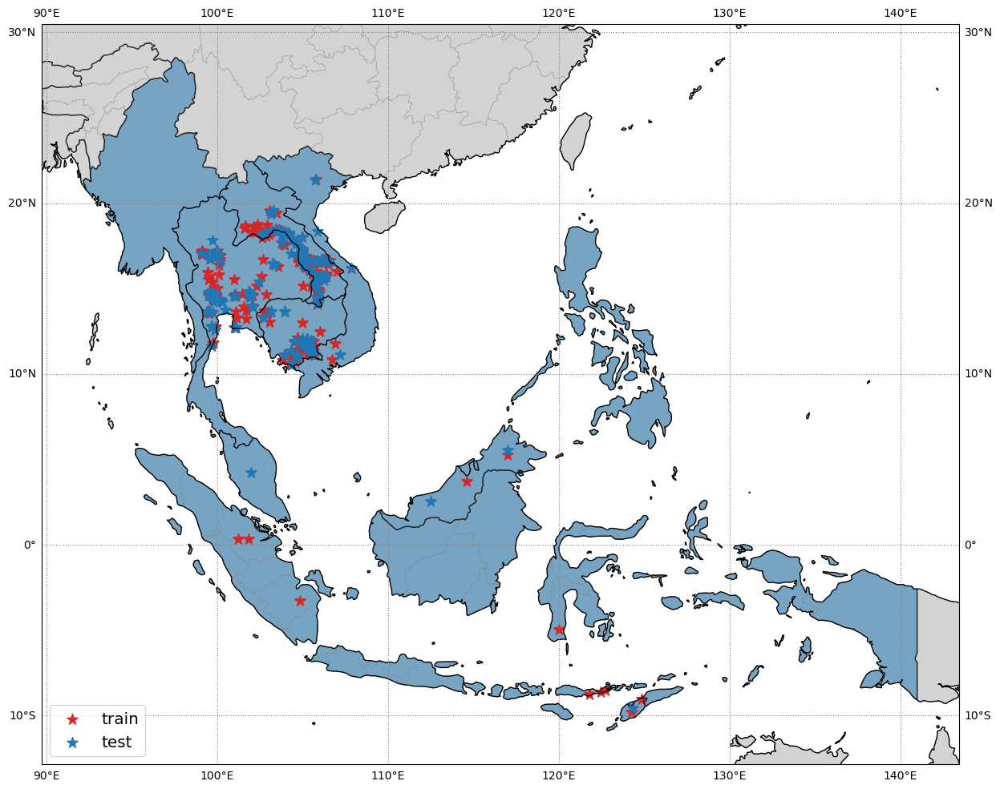

In [4]:
%run '01_specie-distribution-mode.ipynb'

# Generate background pseudo-absence data

In [4]:
%run '02_pseudo-absence-mode.ipynb'

load presence
            lon        lat                    geometry
0    102.891019  14.619860  POINT (102.89102 14.61986)
1     99.871415  12.556519   POINT (99.87141 12.55652)
2    102.294508  15.124336  POINT (102.29451 15.12434)
3    105.563936  11.145789  POINT (105.56394 11.14579)
4    102.050979  13.981498  POINT (102.05098 13.98150)
..          ...        ...                         ...
204  104.700144  16.808153  POINT (104.70014 16.80815)
205  104.857240  16.550163  POINT (104.85724 16.55016)
206  102.591854  15.723884  POINT (102.59185 15.72388)
207  101.074627  12.706378  POINT (101.07463 12.70638)
208  104.527536  11.886005  POINT (104.52754 11.88601)

[209 rows x 3 columns]


AttributeError: 'NoneType' object has no attribute 'is_geographic'

AttributeError: 'NoneType' object has no attribute 'is_geographic'

# Predictive Variables

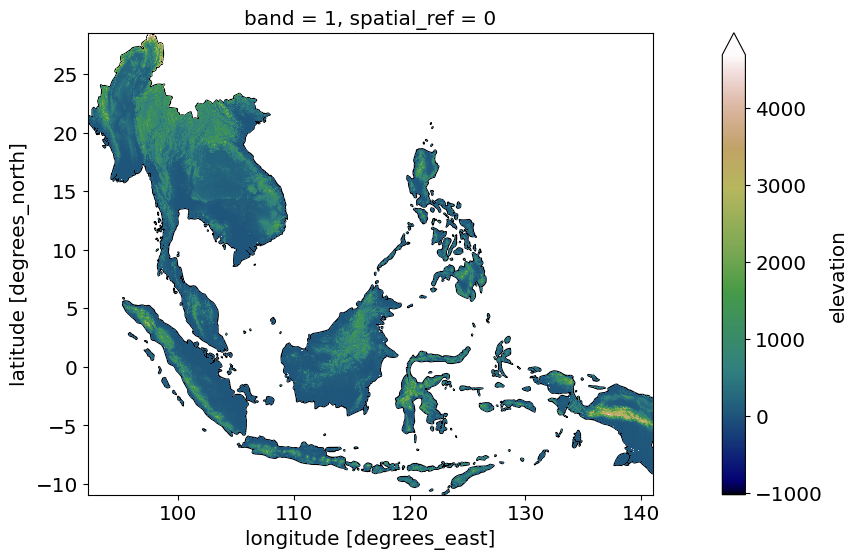

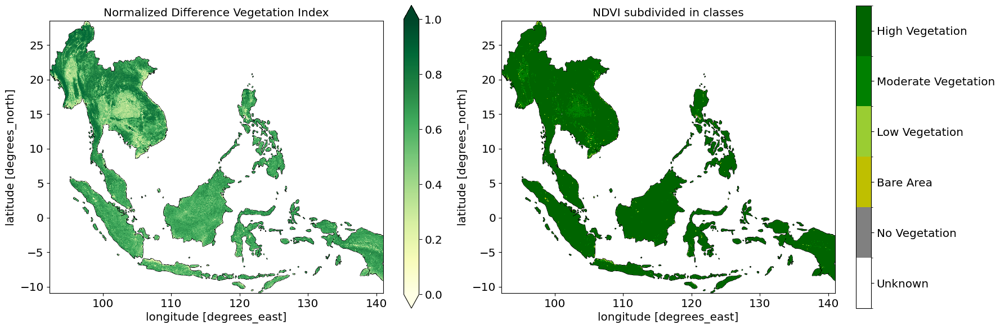

In [6]:
%run '03_predictive-variables_bioclim.ipynb'

# BIOCLIM

In [9]:
# -----------------------------------------------------------------------------
# Data and Model Specification
# -----------------------------------------------------------------------------

# 1. Define the source folder for the bioclimatic data.
# This path points to the directory containing the raw climate model outputs.
#bioclim_folder = "/mnt/bweeding_workspace/ACIAR/bioclim_rasters/ba_cordex_month_x++_q100/"
bioclim_folder = "/mnt/bweeding_workspace/ACIAR/bioclim_rasters/ensemble_means/"

# 2. Define the climate models to be processed.
# This list contains the file prefixes for each climate model to be included
# in the analysis. Inactive models are commented out.
models = ["ensemble_mean"]


# "CNRM-CERFACS-CNRM-CM5_SMHI-RCA4_"
# "CNRM-CM5_ICTP-RegCM4-3_"
# "IPSL-IPSL-CM5A-LR_ICTP-RegCM4-3_"
# "MOHC-HadGEM2-ES_GERICS-REMO2015_"
# "MOHC-HadGEM2-ES_ICTP-RegCM4-7_"
# "MOHC-HadGEM2-ES_SMHI-RCA4_"
# "MPI-M-MPI-ESM-LR_GERICS-REMO2015_"
# "MPI-M-MPI-ESM-MR_ICTP-RegCM4-3_"
# "MPI-M-MPI-ESM-MR_ICTP-RegCM4-7_"
# "NCC-NorESM1-M_GERICS-REMO2015_"
# "NCC-NorESM1-M_ICTP-RegCM4-7_"
# "NOAA-GFDL-GFDL-ESM2M_ICTP-RegCM4-3_"


# 3. Define a map for project keywords to their full names in the filenames.
# This dictionary translates short internal keywords ('hist', 'future') to the
# corresponding terms found in the data filenames ('historical', 'rcp85').
project_map = {
    'hist': 'historical',
    'future': 'rcp85'
}

# A threshold for temperature values, likely used for data validation to
# ensure that temperature data is in Celsius and not Kelvin.
KELVIN_THRESHOLD = 200.0

## Historical

Bounding box: [92.17958984375002, -10.90966796875, 140.97617187500003, 28.517041015624997]

Starting file copy, conversion, and CRS assignment process...
!!! WARNING: Files from previous models in the list will be overwritten. !!!
--------------------------------------------------

Processing Model: ensemble_mean
  -> Project: historical | Destination: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/worldclim
bio_1: /mnt/bweeding_workspace/ACIAR/bioclim_rasters/ensemble_means/ensemble_mean_historical_ba_month_x++_q100_bio_1.tif
    - CONVERTED (K->C) & CRS Set: bio_1.tif
bio_2: /mnt/bweeding_workspace/ACIAR/bioclim_rasters/ensemble_means/ensemble_mean_historical_ba_month_x++_q100_bio_2.tif
    - COPIED & CRS Set (Already Celsius): bio_2.tif
bio_3: /mnt/bweeding_workspace/ACIAR/bioclim_rasters/ensemble_means/ensemble_mean_historical_ba_month_x++_q100_bio_3.tif
    - COPIED & CRS Set (Already Celsius): bio_3.tif
bio_4: /mnt/bweeding_workspace/ACIAR/bioclim_rasters/ensemble_mea

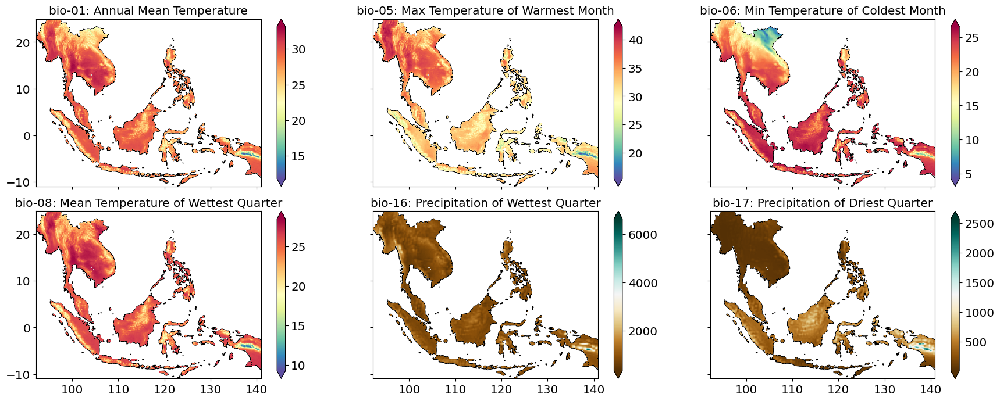

In [8]:
# A boolean flag to determine the processing mode. If False, the script
# processes historical data; if True, it processes future projections.
Future = False
region = training

%run '03_Bioclim_Test_bioclim.ipynb'


## Future

Bounding box: [92.17958984375002, -10.90966796875, 140.97617187500003, 28.517041015624997]

Future processing block is not yet implemented.
Raster telah berhasil dipotong, diselaraskan, dan disimpan di: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/srtm_south-east-asia.tif
Dimensi BIO_1: 488 359
Dimensi SRTM : 488 359
Sama dimensi?  True

Transform BIO_1: | 0.10, 0.00, 92.15|
| 0.00, 0.10,-10.95|
| 0.00, 0.00, 1.00|
Transform SRTM : | 0.10, 0.00, 92.15|
| 0.00, 0.10,-10.95|
| 0.00, 0.00, 1.00|
Sama transform?  True

CRS BIO_1: EPSG:4326
CRS SRTM : EPSG:4326
Sama CRS?  True

Bounds BIO_1: BoundingBox(left=92.14999999999988, bottom=24.950000000000912, right=140.9499999999971, top=-10.949999999999134)
Bounds SRTM : BoundingBox(left=92.14999999999988, bottom=24.950000000000912, right=140.9499999999971, top=-10.949999999999134)
Sama bounds?  True


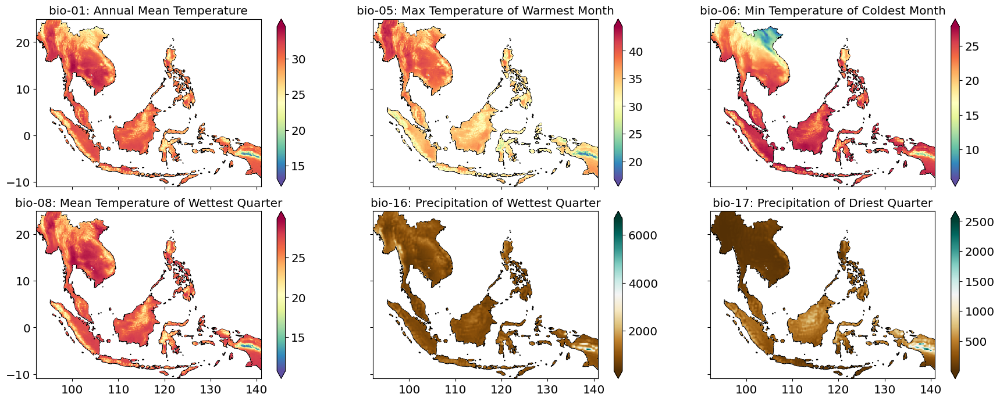

In [9]:
# A boolean flag to determine the processing mode. If False, the script
# processes historical data; if True, it processes future projections.
Future = True

if Future:   
    %run '03_Bioclim_Test_bioclim.ipynb'

# Run Model

In [8]:
# A boolean flag, likely to control a workflow branch for future climate
# scenarios (not used in this specific loop but defined for context).
Future = False

# A dictionary defining different sets of bioclimatic predictor variables for
# the modeling experiments. Each key is a unique identifier for the set.
sets = {
    # Set1: Includes all 19 standard bioclimatic variables.
    "Set1": [i for i in range(1, 20)],

    # Set2: A specific subset of variables.
    "Set2": [2, 11, 13],

    # Set3: The first 11 bioclimatic variables.
    "Set3": [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],

    # Set4: The remaining bioclimatic variables related to precipitation.
    "Set4": [12, 13, 14, 15, 16, 17, 18, 19]

    # Additional sets can be defined and are currently commented out.
    # "Set5": [18, 19, 8, 4, 1],
    # "Set6": [2, 4, 5, 7, 15]
}


# Loop through each set
for set_name, bioclim in sets.items():
    bio1 = set_name
    training = region_train  

    # Run scripts in sequence
    # %run '04_variable-statistics-mode.ipynb'
    bioclim_model = bioclim
    %run '05_run-model-mode.ipynb'
    # %run '06_model-evaluation-mode.ipynb'

NameError: name 'model_prefix' is not defined

NameError: name 'model_prefix' is not defined

# Mapping Bioclim

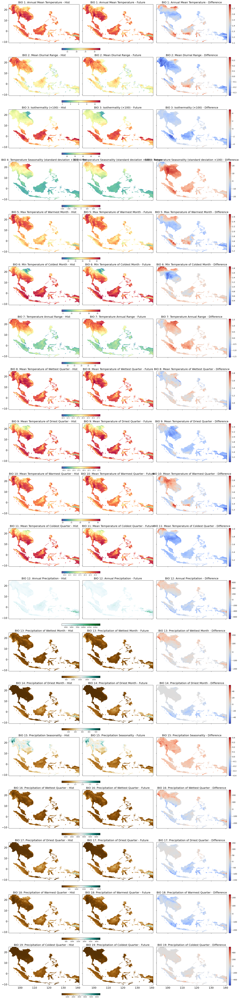

In [11]:
# training = True
# region = region_train

%run '07_Bioclim_mapping.ipynb'

# training = False
# region = region_test

# %run '07_Bioclim_mapping.ipynb'

In [12]:
print("end")
client.close()

end
